## Tacotron 2 inference code 
Edit the variables **checkpoint_path** and **text** to match yours and run the entire code to generate plots of mel outputs, alignments and audio synthesis from the generated mel-spectrogram using Griffin-Lim.

#### Import libraries and setup matplotlib

In [1]:
import matplotlib
%matplotlib inline
import matplotlib.pylab as plt

import IPython.display as ipd

import sys
sys.path.append('waveglow/')
import numpy as np
import torch

from hparams import create_hparams
from model import Tacotron2
from layers import TacotronSTFT, STFT
from audio_processing import griffin_lim
from train import load_model
from text import text_to_sequence, code_to_sequence
from denoiser import Denoiser
from utils import load_code_dict, load_filepaths_and_text, load_obs_label_dict

/data/sls/u/wnhsu/code/tacotron2_factory/tacotron2_20191017_dev/plotting_utils.py:2: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/usr/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/data/sls/u/wnhsu/vtenvs/pt1.3_cp36/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/data/sls/u/wnhsu/vtenvs/pt1.3_cp36/lib/python3.6/site-packages/traitlets/config/application.py", line 664, in launch_instance
    app.start()
  File "/data/sls/u/wnhsu/vtenvs/pt1.3_cp36/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 563

In [2]:
def plot_data(data, figsize=(16, 2)):
    fig, axes = plt.subplots(1, len(data), figsize=figsize)
    for i in range(len(data)):
        axes[i].imshow(data[i], aspect='auto', origin='bottom', 
                       interpolation='none')

#### Setup hparams

In [3]:
import json
# ckpt_args_path = './exps/vctk_code_mdl-01000-01100_vq3_chunk_spkemb_run1/args.json'
# ckpt_args_path = './exps/finished/vctk_lat64_klw0.01_run1/args.json'
# ckpt_args_path = './exps/libritts_code_mdl-01000-01100_vq3_chunk_spkemb_run1/args.json'
# ckpt_args_path = './exps/libritts_code_mdl-01000-01100_vq3_chunk_lat128_klw0.01_run1/args.json'
ckpt_args_path = './exps/flickr8k_code_mdl-01000-01100_vq3_chunk_spkemb_run1/args.json'

hparams = create_hparams()
with open(ckpt_args_path, 'r') as f:
    args_dict = json.load(f)
for k in args_dict:
    assert(hasattr(hparams, k)) 
    if getattr(hparams, k) != args_dict[k]:
        print('setting %20s from %20s to %20s' % ( 
            k, getattr(hparams, k), args_dict[k]))
        setattr(hparams, k, args_dict[k])

hparams.distributed_run = False

setting               epochs from                  500 to                  250
setting      distributed_run from                False to                 True
setting             dist_url from tcp://localhost:54321 to tcp://localhost:54320
setting          num_workers from                    8 to                   16
setting       training_files from filelists/ljs_audio_text_train_filelist.txt to ./filelists/rdvq_01000_01100/flickr8k_tr.txt
setting     validation_files from filelists/ljs_audio_text_val_filelist.txt to ./filelists/rdvq_01000_01100/flickr8k_dt.txt
setting         text_or_code from                 text to                 code
setting             code_key from                      to          code_quant3
setting            code_dict from                      to ./filelists/rdvq_01000_01100/code_dict_quant3
setting           chunk_code from                False to                 True
setting           chunk_incr from                    5 to                   15
setting     

#### Load model from checkpoint

In [4]:
# checkpoint_path = "./exps/vctk_code_mdl-01000-01100_vq3_chunk_spkemb_run1/checkpoint_160000"
# checkpoint_path = "./exps/finished/vctk_lat64_klw0.01_run1/checkpoint_220000"
# checkpoint_path = "./exps/libritts_code_mdl-01000-01100_vq3_chunk_spkemb_run1/checkpoint_168000"
# checkpoint_path = "./exps/libritts_code_mdl-01000-01100_vq3_chunk_lat128_klw0.01_run1/checkpoint_34000"
checkpoint_path = './exps/flickr8k_code_mdl-01000-01100_vq3_chunk_spkemb_run1/checkpoint_18000'
model = load_model(hparams)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
_ = model.cuda().eval().half()

#### Load WaveGlow for mel2audio synthesis and denoiser

In [5]:
waveglow_path = './pretrained/waveglow_256channels_new.pt'
waveglow = torch.load(waveglow_path)['model']
waveglow.cuda().eval().half()
for k in waveglow.convinv:
    k.float()
denoiser = Denoiser(waveglow)

#### Prepare text input

In [22]:
# text = "How is the weather today?"
# sequence = np.array(text_to_sequence(text, ['english_cleaners']))[None, :]
# sequence = torch.autograd.Variable(
#     torch.from_numpy(sequence)).cuda().long()

# data = load_filepaths_and_text("filelists/rdvq_01000_01100/vctk_trimmed_valid_filelist.txt")
# data = load_filepaths_and_text("filelists/rdvq_01000_01100/libritts_train460_valid.txt")
# data = load_filepaths_and_text("filelists/rdvq_01000_01100/places_eng_400k_val_filelist.txt")
data = load_filepaths_and_text("filelists/rdvq_01000_01100/flickr8k_dt.txt")

# obs_dict = load_obs_label_dict('filelists/original/vctk_speakers.txt')
# obs_dict = load_obs_label_dict('filelists/original/libritts_train960_speakers.txt')
obs_dict = load_obs_label_dict('filelists/original/flickr8k_speakers.txt')

code_dict = load_code_dict(hparams.code_dict)
# Places: 50, 220, 250
# Flickr: 3
idx = 5
speaker = data[idx].get('speaker', 'N/A')
speaker_id = obs_dict.get(speaker, 0)
code = data[idx][hparams.code_key].split()
print('ID=%d, SPEAKER=%s (SID=%d)' % (idx, speaker, speaker_id))
print('(TEXT LEN=%d) %s' % (len(data[idx]['text']), data[idx]['text']))
print('(CODE LEN=%d) %s' % (len(code), ' '.join(code)))
sequence = np.array(code_to_sequence(code, code_dict, True))[None, :]
sequence = torch.autograd.Variable(
    torch.from_numpy(sequence)).cuda().long()
ipd.display(ipd.Audio(data[idx]['audio']))

ID=5, SPEAKER=ARAQAN8GMD2ZQ (SID=179)
(TEXT LEN=58) A beige dog runs through the shrubbery toward the camera .
(CODE LEN=100) 263 32 32 32 32 32 32 32 32 32 208 208 263 336 501 501 501 501 249 249 224 242 362 825 825 740 202 202 216 637 637 489 277 277 277 277 277 48 815 12 12 556 466 242 119 119 467 880 216 637 983 230 820 525 48 791 791 717 202 64 64 223 110 110 1003 663 84 84 84 256 775 775 417 272 272 417 228 228 622 230 654 289 880 880 374 374 417 821 112 141 536 113 87 12 12 445 110 110 110 5


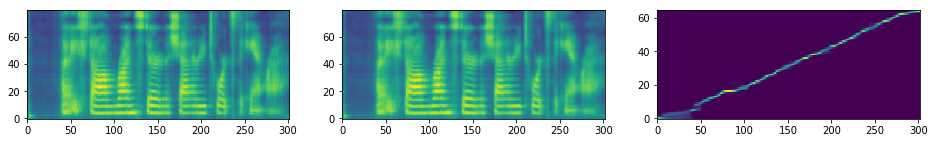

In [23]:
(mel_outputs, mel_outputs_postnet, _, 
 alignments) = model.inference(sequence, torch.LongTensor(1).cuda().fill_(speaker_id))
plot_data((mel_outputs.float().data.cpu().numpy()[0],
           mel_outputs_postnet.float().data.cpu().numpy()[0],
           alignments.float().data.cpu().numpy()[0].T))
plt.show()

with torch.no_grad():
    audio = waveglow.infer(mel_outputs_postnet, sigma=0.666)
ipd.display(ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate))

audio_denoised = denoiser(audio, strength=0.01)[:, 0]
ipd.display(ipd.Audio(audio_denoised.cpu().numpy(), rate=hparams.sampling_rate))

tensor([], device='cuda:0', size=(1, 0), dtype=torch.float16)
tensor([10], device='cuda:0')


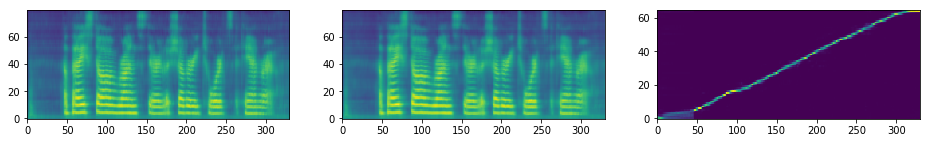

tensor([11], device='cuda:0')
Warning! Reached max decoder steps


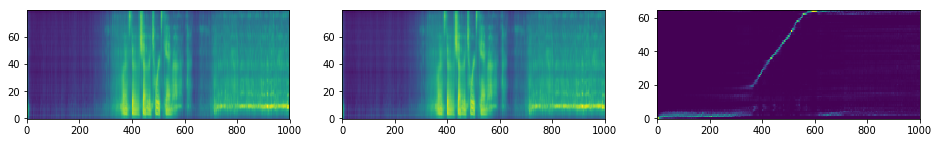

tensor([12], device='cuda:0')
Warning! Reached max decoder steps


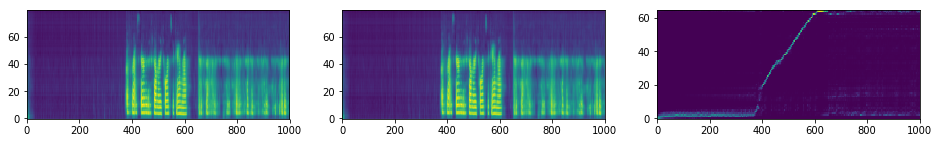

tensor([13], device='cuda:0')


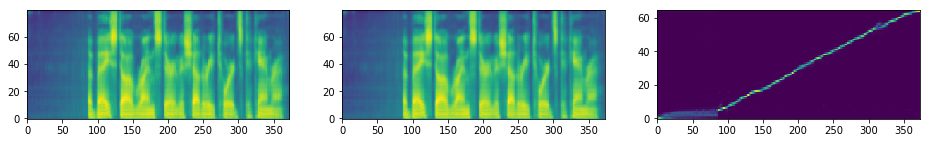

tensor([14], device='cuda:0')


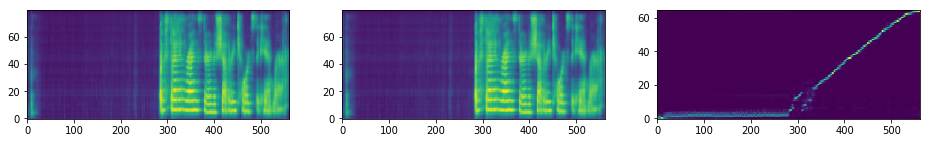

tensor([15], device='cuda:0')


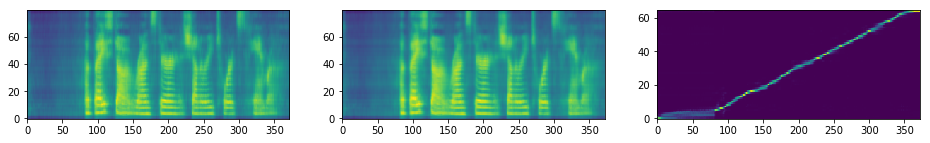

tensor([16], device='cuda:0')
Warning! Reached max decoder steps


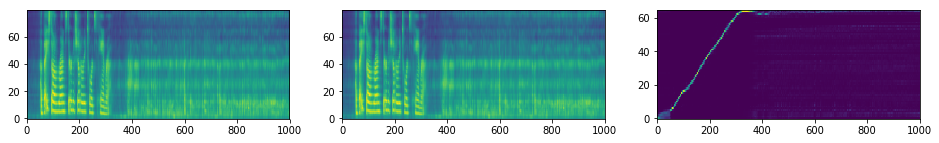

tensor([17], device='cuda:0')


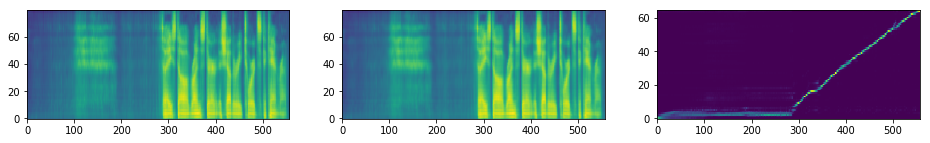

tensor([18], device='cuda:0')
Warning! Reached max decoder steps


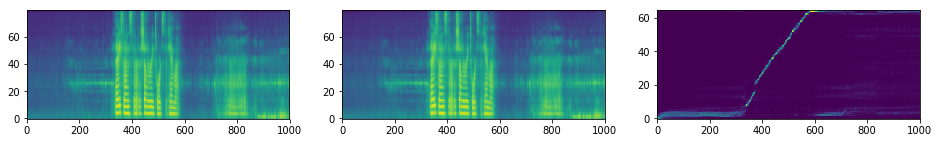

tensor([19], device='cuda:0')
Warning! Reached max decoder steps


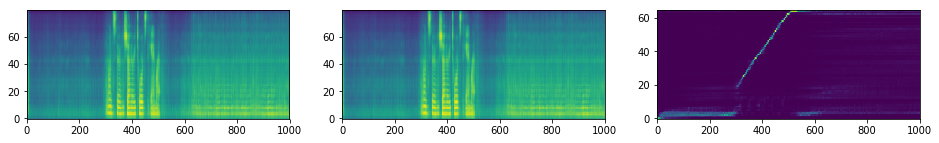

In [24]:
# enumerate a few speakers

lat = torch.FloatTensor(1, hparams.lat_dim).cuda().zero_()
lat = lat.normal_() * 0.5
lat = lat.type(model.embedding.weight.type())
print(lat)

for spk_id in range(10, 20):
    obs_labels = torch.LongTensor(1).cuda().fill_(spk_id)
    print(obs_labels)

    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence, obs_labels, lat)
    plot_data((mel_outputs.float().data.cpu().numpy()[0],
               mel_outputs_postnet.float().data.cpu().numpy()[0],
               alignments.float().data.cpu().numpy()[0].T))
    plt.show()

    with torch.no_grad():
        audio = waveglow.infer(mel_outputs_postnet, sigma=0.666)
    ipd.display(ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate))

    audio_denoised = denoiser(audio, strength=0.01)[:, 0]
    ipd.display(ipd.Audio(audio_denoised.cpu().numpy(), rate=hparams.sampling_rate))

tensor([0], device='cuda:0')
tensor([[ 0.2893, -0.2625, -0.1460,  0.0070, -1.0820,  0.1395,  0.8081, -0.0839,
         -0.5825, -0.3918, -0.2981,  0.2849,  0.4021,  0.3660,  0.2002,  0.4958,
          0.3267, -0.1104, -1.4248, -0.2131,  0.2313, -0.2052, -0.1984,  0.4897,
          0.7944, -0.5371, -0.2179, -1.2188,  0.3560, -0.6729,  0.3013, -0.2325,
         -0.3457,  0.3992,  0.3628, -0.2754, -0.3091, -0.7769, -1.0156,  0.5249,
          0.0569, -0.3696,  0.2141,  0.6289,  0.3411, -0.1715,  0.0170,  0.3833,
         -1.2969, -0.2856,  0.2179, -0.0837,  0.2578,  0.2164, -0.0433, -0.2815,
         -0.6318,  0.3616,  1.2480, -0.5493, -0.7339,  0.2551, -0.6104,  0.7842,
         -0.0463, -0.0061,  0.8291,  0.4202,  0.3472,  0.1100, -0.8247,  0.8682,
         -0.1183, -0.5093, -0.2700, -0.0729, -1.0713, -0.6021,  0.6714,  0.0114,
         -0.6792,  0.0833,  0.3765,  0.3870, -0.2715,  0.1904, -0.0826,  0.3162,
          0.1212, -0.8638, -0.9004, -0.4336,  0.1429, -0.0449, -0.0421, -0.0642,

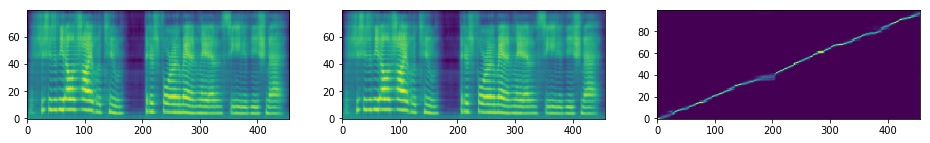

tensor([0], device='cuda:0')
tensor([[-1.0547, -0.0019, -0.6245, -1.3896, -0.1960,  0.0083,  0.6108,  0.1981,
          0.4927,  0.5366,  0.2788, -0.1864, -0.3718, -0.3953,  0.0586, -0.1742,
          0.7222, -0.4666,  0.0018,  0.3887, -0.2374,  0.2651, -0.4055, -0.0990,
          0.5117,  0.5220, -0.2466,  0.7446,  0.4150, -0.5991,  0.0471, -0.6821,
          0.5762,  0.4761,  0.2812,  0.7632, -0.6074, -0.5244, -0.5483, -0.3284,
          0.7715,  0.2805,  0.1702, -0.2352, -0.2839,  0.2742, -0.4651, -0.1440,
          0.0933,  0.0829,  0.0941,  0.0868,  0.3760,  0.0037, -0.1163,  0.3538,
          0.2957,  0.5034, -0.5449, -0.0124, -0.4360,  0.7305,  0.1388,  0.2073,
         -0.1456,  0.1100, -0.4043, -0.0921,  0.2164, -0.2583,  0.3704,  0.1775,
          0.6162, -0.2363,  0.6367,  0.6270, -0.2927, -0.2362,  0.1345,  0.0177,
          0.5107,  0.0897,  0.3696, -0.1477,  0.4705,  0.2705, -0.7837, -0.3071,
         -0.1504,  0.6323,  0.2361,  1.0361, -0.0854, -0.7393,  0.5942, -0.5010,

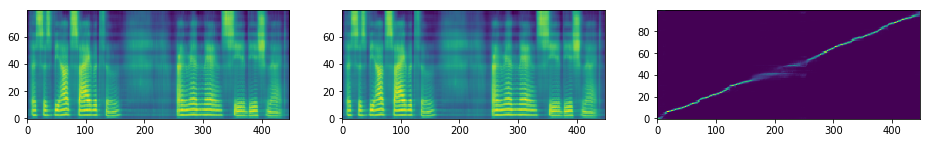

tensor([0], device='cuda:0')
tensor([[ 0.4050, -0.3010,  0.0847, -0.6372, -0.0457,  0.2056, -0.5210, -0.0981,
          0.6538, -0.2172, -0.8301, -0.1058, -0.0337, -0.2372,  0.0262,  0.5059,
         -0.0186, -0.0332,  0.0204,  0.4270, -0.1462,  0.2089, -0.6616,  0.1256,
          0.3523,  0.3899,  0.1765,  0.2773, -0.1685,  0.0874, -0.4421,  0.2661,
         -1.1406, -0.2172, -0.4211, -0.5459, -0.4111, -0.0354,  1.1465,  0.6953,
         -0.5547,  0.3760, -0.3127,  0.1467, -0.4714, -0.6343,  0.5425,  0.3193,
         -0.3943, -0.3914, -0.2637,  0.1146, -0.0466, -0.1294, -0.2323, -0.5923,
          0.2507, -0.2197,  0.4832,  1.1250, -0.9395, -0.0912, -1.1738,  0.4651,
          0.7017, -0.1350, -0.6133,  0.0594, -0.6855,  0.1553, -0.4434, -0.2656,
          0.7441, -0.5186,  0.7529,  0.3079, -0.5093, -0.4631,  0.1740,  0.6973,
          0.1509, -0.1274, -0.3069,  0.5444,  1.3623,  0.5190, -0.1876, -0.7891,
         -0.4883, -0.3909,  1.5215, -0.5620,  0.5469, -0.7104, -0.3647, -0.3677,

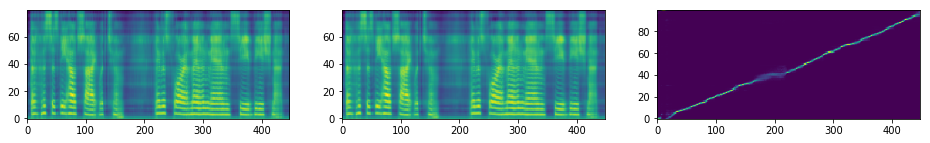

tensor([0], device='cuda:0')
tensor([[ 0.9385,  0.4568,  0.4316,  0.7090,  0.1251,  0.4536, -1.2021, -0.0969,
          0.3079,  0.7388, -0.2915,  0.3638,  0.5996, -0.0207, -0.7002, -0.0549,
          0.3362, -0.4565,  0.7036,  0.1187,  0.0556,  0.1333, -0.0665, -0.8496,
         -0.5640,  1.3301, -1.1357,  1.0430,  0.0131,  0.0376, -0.1049, -0.0705,
         -0.2208, -0.1550, -0.1281,  0.1781, -0.2272,  0.2054,  0.0237,  0.0825,
         -0.5181, -0.3962,  0.6304,  0.0062, -0.5386,  0.4724, -0.0936,  0.6699,
          0.3787, -0.3557,  0.7246,  0.7134, -0.7432,  0.4558,  0.3567,  0.0746,
          0.4407, -0.3179, -1.4336,  0.5874, -0.6177,  0.2805,  0.1494,  0.0048,
          1.0869,  0.4053,  0.4475,  0.5127, -0.8486,  0.0296, -0.0731, -0.3582,
          0.3611, -0.2559,  0.8228, -0.6924,  0.4954, -0.4924, -0.4058, -0.6172,
          0.2163,  0.0699, -0.1208,  0.7930,  0.6826,  0.0629, -0.4551,  0.7681,
         -0.4878,  0.3303, -0.3828, -0.8340,  0.1718,  0.7461, -0.6729,  0.4646,

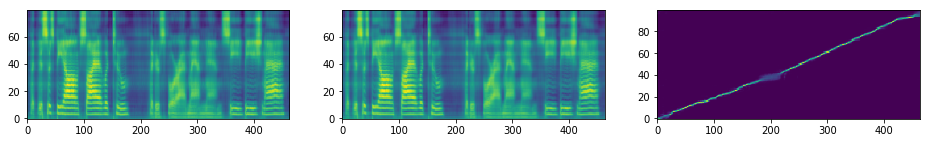

tensor([0], device='cuda:0')
tensor([[-0.3469,  0.8281, -0.0428,  0.1978, -0.2026,  0.4395,  0.2417,  0.1122,
          0.1738,  0.4768,  0.0340,  0.4885, -0.2578,  0.7588,  0.3416,  0.1315,
          0.4507,  0.7515,  0.0574, -0.6074,  0.5366,  0.3120, -0.4910,  0.2773,
          0.1584,  0.1788,  0.2961, -0.3218, -0.3770,  0.0408,  0.6338,  1.3984,
         -0.7827, -0.8677, -1.0020, -0.8384, -0.0884, -0.2646,  0.1853,  0.3254,
          0.3008, -0.7080, -0.7388,  0.3982,  0.9033,  0.1720,  0.2296,  0.8647,
         -0.7153,  0.4368,  0.5859, -0.1726, -0.6665, -0.3054, -1.3027, -0.3953,
          0.4221, -0.0316, -0.7075, -0.0097,  0.8022,  0.2253, -0.4041, -0.7588,
          0.4941, -0.2179, -0.0372,  0.1432, -0.6289, -0.4080, -0.0975,  1.2217,
         -1.3887, -0.1527,  0.1062, -0.2378,  0.2573, -0.4397,  0.4067,  0.4526,
         -0.4534, -0.0874, -0.3140, -0.4485, -0.0233,  0.4692,  0.6479,  0.0550,
         -0.5684,  1.2715,  0.0980, -1.1025, -0.4668, -0.1656, -0.2196, -0.5654,

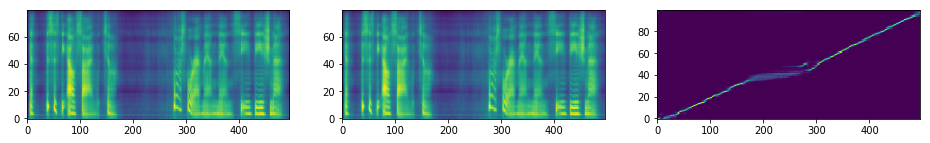

In [19]:
# random sample latent vectors
torch.manual_seed(12345)
for _ in range(5):
    obs_labels = torch.LongTensor(1).cuda().fill_(0)
    print(obs_labels)

    lat = torch.FloatTensor(1, hparams.lat_dim).cuda().zero_()
    lat = lat.normal_() * 0.5
    lat = lat.type(model.embedding.weight.type())
    print(lat)

    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence, obs_labels, lat)
    plot_data((mel_outputs.float().data.cpu().numpy()[0],
               mel_outputs_postnet.float().data.cpu().numpy()[0],
               alignments.float().data.cpu().numpy()[0].T))
    plt.show()

    with torch.no_grad():
        audio = waveglow.infer(mel_outputs_postnet, sigma=0.666)
    ipd.display(ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate))

    audio_denoised = denoiser(audio, strength=0.01)[:, 0]
    ipd.display(ipd.Audio(audio_denoised.cpu().numpy(), rate=hparams.sampling_rate))

#### Decode text input and plot results

In [9]:
# mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence, obs_labels, lat)
# plot_data((mel_outputs.float().data.cpu().numpy()[0],
#            mel_outputs_postnet.float().data.cpu().numpy()[0],
#            alignments.float().data.cpu().numpy()[0].T))

#### Synthesize audio from spectrogram using WaveGlow

In [10]:
# with torch.no_grad():
#     audio = waveglow.infer(mel_outputs_postnet, sigma=0.666)
# ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate)

#### (Optional) Remove WaveGlow bias

In [11]:
# audio_denoised = denoiser(audio, strength=0.01)[:, 0]
# ipd.Audio(audio_denoised.cpu().numpy(), rate=hparams.sampling_rate) 